In [1]:
#pip show keras
#!pip install keras


In [2]:
#pip install tensorflow


In [3]:
#pip uninstall keras
#pip uninstall tensorflow
#pip install tensorflow==2.6.0
#pip install keras==2.6.0


In [4]:
# Import libraries
import os  # For interacting with the file system
import shutil  # For managing files and directories in a cross-platform manner
import keras  # For building deep learning models
import numpy as np  # For numerical operations on arrays
from glob import glob  # For finding file paths
from tqdm import tqdm  # For progress bars

# Data preprocessing
from keras.preprocessing.image import ImageDataGenerator  # For image data augmentation

# Data visualization
import seaborn as sns  # For statistical visualizations
import plotly.graph_objs as go  # For interactive visualizations
import matplotlib.pyplot as plt  # For creating static plots

# Model architecture
from keras import Sequential  # For building sequential models
from keras.models import load_model  # For loading pre-trained models
from keras.layers import Dense, GlobalAvgPool2D as GAP, Dropout  # For defining model layers

# Training callbacks
from keras.callbacks import ModelCheckpoint, EarlyStopping  # For training callbacks

# Pre-trained models
from tensorflow.keras.applications import InceptionV3, Xception, ResNet152V2  # For using pre-trained models


In [5]:
# Set the path to the dataset
data_path = 'mammals'

# Get a list of class names from the data path
class_names = sorted(os.listdir(data_path))

# Count the number of classes
num_classes = len(class_names)

# Print the class names and the total number of classes
print("Class Names: \n", class_names)
print("Number of Classes:", num_classes)


Class Names: 
 ['african_elephant', 'alpaca', 'american_bison', 'anteater', 'arctic_fox', 'armadillo', 'baboon', 'badger', 'blue_whale', 'brown_bear', 'camel', 'dolphin', 'giraffe', 'groundhog', 'highland_cattle', 'horse', 'jackal', 'kangaroo', 'koala', 'manatee', 'mongoose', 'mountain_goat', 'opossum', 'orangutan', 'otter', 'polar_bear', 'porcupine', 'red_panda', 'rhinoceros', 'sea_lion', 'seal', 'snow_leopard', 'squirrel', 'sugar_glider', 'tapir', 'vampire_bat', 'vicuna', 'walrus', 'warthog', 'water_buffalo', 'weasel', 'wildebeest', 'wombat', 'yak', 'zebra']
Number of Classes: 45


In [6]:
# Get the number of samples in each class
class_sizes = []
for name in class_names:
    class_size = len(os.listdir(data_path + "/" + name))
    class_sizes.append(class_size)
    
# Print the class distribution
print("Class Distribution:\n", class_sizes)

Class Distribution:
 [347, 333, 343, 299, 315, 331, 330, 310, 243, 300, 254, 311, 305, 309, 311, 303, 278, 317, 319, 333, 287, 328, 330, 340, 349, 356, 321, 329, 274, 333, 327, 350, 325, 253, 317, 239, 215, 284, 259, 314, 282, 307, 315, 254, 272]


In [7]:
class_name_size = dict(zip(class_names, class_sizes))
display(class_name_size)

{'african_elephant': 347,
 'alpaca': 333,
 'american_bison': 343,
 'anteater': 299,
 'arctic_fox': 315,
 'armadillo': 331,
 'baboon': 330,
 'badger': 310,
 'blue_whale': 243,
 'brown_bear': 300,
 'camel': 254,
 'dolphin': 311,
 'giraffe': 305,
 'groundhog': 309,
 'highland_cattle': 311,
 'horse': 303,
 'jackal': 278,
 'kangaroo': 317,
 'koala': 319,
 'manatee': 333,
 'mongoose': 287,
 'mountain_goat': 328,
 'opossum': 330,
 'orangutan': 340,
 'otter': 349,
 'polar_bear': 356,
 'porcupine': 321,
 'red_panda': 329,
 'rhinoceros': 274,
 'sea_lion': 333,
 'seal': 327,
 'snow_leopard': 350,
 'squirrel': 325,
 'sugar_glider': 253,
 'tapir': 317,
 'vampire_bat': 239,
 'vicuna': 215,
 'walrus': 284,
 'warthog': 259,
 'water_buffalo': 314,
 'weasel': 282,
 'wildebeest': 307,
 'wombat': 315,
 'yak': 254,
 'zebra': 272}

In [8]:
# Define the data
data = go.Pie(labels=class_names, values=class_sizes)

# Define the layout
layout = go.Layout(title={"text": "Class Distribution", "x": 0.5})

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()


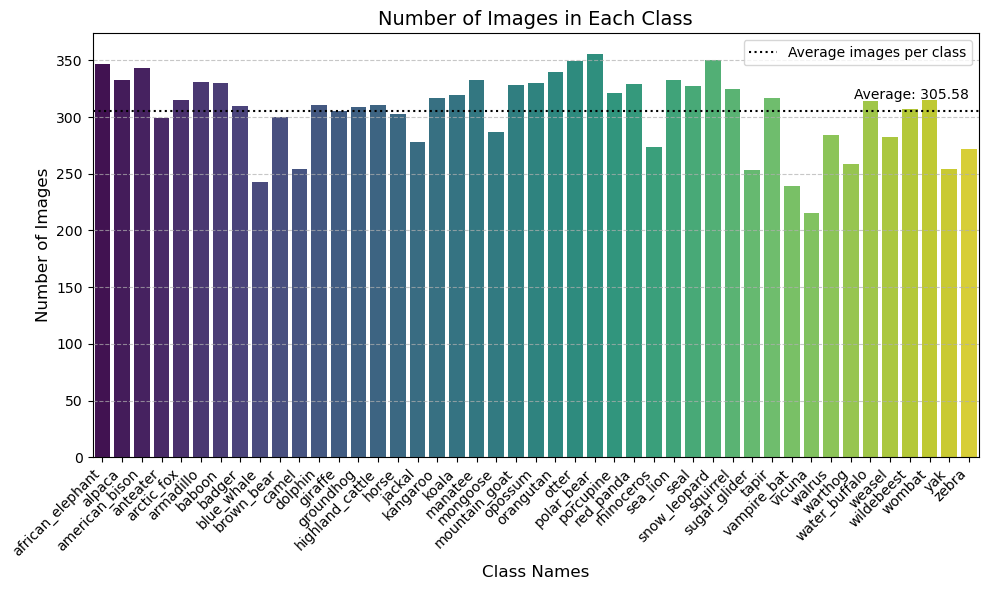

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the size of the figure
plt.figure(figsize=(10, 6))

# Plot a bar chart using the class names as the x-axis and class sizes as the y-axis
sns.barplot(x=class_names, y=class_sizes, palette='viridis')

# Add a grid to the plot
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Calculate the mean number of images across all classes
average_images_per_class = np.mean(class_sizes)

# Add a horizontal line to show the mean number of images across all classes
plt.axhline(average_images_per_class, color='black', linestyle=':', label="Average images per class")

# Add labels and title
plt.xlabel('Class Names', fontsize=12)
plt.ylabel('Number of Images', fontsize=12)
plt.title('Number of Images in Each Class', fontsize=14)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Show the mean value as text on the plot
plt.text(len(class_names) - 1, average_images_per_class + 10, f'Average: {average_images_per_class:.2f}', ha='right', fontsize=10, color='black')

# Show the legend
plt.legend()

# Show the plot with tight layout
plt.tight_layout()
plt.show()


In [10]:
# Set the path to the directory where the sampled data will be saved
sampled_data_path = './sampled-data'

# Create the sampled data directory if it doesn't exist
if not os.path.exists(sampled_data_path):
    os.mkdir(sampled_data_path)

# Set the percentage of each class to sample
sample_percent = 0.1

animal_name = ['african_elephant', 'alpaca', 'american_bison', 'anteater', 'arctic_fox', 'armadillo', 'baboon', 'badger', 'blue_whale', 'brown_bear', 'camel', 'dolphin', 'giraffe', 'groundhog', 'highland_cattle', 'horse', 'jackal', 'kangaroo', 'koala', 'manatee', 'mongoose', 'mountain_goat', 'opossum', 'orangutan', 'otter', 'polar_bear', 'porcupine', 'red_panda', 'rhinoceros', 'sea_lion', 'seal', 'snow_leopard', 'squirrel', 'sugar_glider', 'tapir', 'vampire_bat', 'vicuna', 'walrus', 'warthog', 'water_buffalo', 'weasel', 'wildebeest', 'wombat', 'yak', 'zebra']

class_names_dict = {name: name + '1' for name in animal_name}
print(class_names_dict)




{'african_elephant': 'african_elephant1', 'alpaca': 'alpaca1', 'american_bison': 'american_bison1', 'anteater': 'anteater1', 'arctic_fox': 'arctic_fox1', 'armadillo': 'armadillo1', 'baboon': 'baboon1', 'badger': 'badger1', 'blue_whale': 'blue_whale1', 'brown_bear': 'brown_bear1', 'camel': 'camel1', 'dolphin': 'dolphin1', 'giraffe': 'giraffe1', 'groundhog': 'groundhog1', 'highland_cattle': 'highland_cattle1', 'horse': 'horse1', 'jackal': 'jackal1', 'kangaroo': 'kangaroo1', 'koala': 'koala1', 'manatee': 'manatee1', 'mongoose': 'mongoose1', 'mountain_goat': 'mountain_goat1', 'opossum': 'opossum1', 'orangutan': 'orangutan1', 'otter': 'otter1', 'polar_bear': 'polar_bear1', 'porcupine': 'porcupine1', 'red_panda': 'red_panda1', 'rhinoceros': 'rhinoceros1', 'sea_lion': 'sea_lion1', 'seal': 'seal1', 'snow_leopard': 'snow_leopard1', 'squirrel': 'squirrel1', 'sugar_glider': 'sugar_glider1', 'tapir': 'tapir1', 'vampire_bat': 'vampire_bat1', 'vicuna': 'vicuna1', 'walrus': 'walrus1', 'warthog': 'war

In [11]:

# Loop through each class directory and copy 2000 images or less to the sampled data directory
for class_name in os.listdir(data_path):
    # Get the path to the original class directory
    class_path = os.path.join(data_path, class_name)
    # Get the English name of the class
    class_name_en = class_names_dict[class_name]
    # Get the path to the sampled class directory
    sampled_class_path = os.path.join(sampled_data_path, class_name_en)
    # Create the sampled class directory and fill it up only if it doesn't exist ********
    if not os.path.exists(sampled_class_path):
        os.mkdir(sampled_class_path)
        # Get a list of all the image files in the class directory
        image_files = os.listdir(class_path)
        # Calculate the number of images to sample **************
        image_class_size = class_name_size[class_name]
        if image_class_size > 2000:
            num_images = 2000
        else:
            num_images = int(image_class_size)
        # Sample the images
        sampled_images = np.random.choice(image_files, size=num_images, replace=False)
        # Copy the sampled images to the sampled class directory
        for image_name in sampled_images:
            src_path = os.path.join(class_path, image_name)
            dst_path = os.path.join(sampled_class_path, image_name)
            shutil.copyfile(src_path, dst_path)


In [12]:
# Get a list of class names from the sampled data directory
class_names = sorted(os.listdir(sampled_data_path))

# Get the number of samples in each class
class_sizes = []
for name in class_names:
    # Get the number of samples in the class directory
    class_size = len(os.listdir(os.path.join(sampled_data_path, name)))
    class_sizes.append(class_size)
    
# Print the class distribution
print("Class Distribution:\n", class_sizes)

Class Distribution:
 [347, 333, 343, 299, 315, 331, 330, 310, 243, 300, 254, 311, 305, 309, 311, 303, 278, 317, 319, 333, 287, 328, 330, 340, 349, 356, 321, 329, 274, 333, 327, 350, 325, 253, 317, 239, 215, 284, 259, 314, 282, 307, 315, 254, 272]


In [13]:
# Define the data
data = go.Pie(labels=class_names, values=class_sizes)

# Define the layout
layout = go.Layout(title={"text": "Class Distribution", "x": 0.5})

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()


In [14]:
# Initialize Generator with the specified image transformations and preprocessing
# rescale: normalizes pixel values from 0-255 to 0-1
# horizontal_flip: randomly flips images horizontally
# vertical_flip: randomly flips images vertically
# rotation_range: randomly rotates images by a given range in degrees
# validation_split: splits the data into training and validation sets, with 20% of the data used for validation
data_generator = ImageDataGenerator(
    rescale=1./255, 
    horizontal_flip=True, 
    vertical_flip=True, 
    rotation_range=20, 
    validation_split=0.2)

# Load training data from the specified directory and apply the generator
# target_size: resizes the images to a specified size
# class_mode: specifies the type of label encoding, binary for 2 classes
# batch_size: specifies the number of samples per batch
# shuffle: shuffles the data after each epoch
# subset: specifies the subset of data to load, in this case, the training set
train_data = data_generator.flow_from_directory(
    sampled_data_path, 
    target_size=(256,256), 
    class_mode='binary', 
    batch_size=32, 
    shuffle=True, 
    subset='training')

# Load validation data from the specified directory and apply the generator
# subset: specifies the subset of data to load, in this case, the validation set
valid_data = data_generator.flow_from_directory(
    sampled_data_path, 
    target_size=(256,256), 
    class_mode='binary', 
    batch_size=32, 
    shuffle=True, 
    subset='validation')

Found 11020 images belonging to 45 classes.
Found 2731 images belonging to 45 classes.


In [15]:
def show_image(image, image_title=None):
    '''
    This function takes in an image and an optional title and plots the image.
    '''
    # Display the image
    plt.imshow(image)
    
    # Set the title of the plot if provided
    plt.title(image_title)
    
    # Turn off the axes in the plot
    plt.axis('off')

In [16]:
def get_random_data(data_tuple):
    """
    Function to get a random data point from a given dataset.

    Args:
    data_tuple (tuple): A tuple containing the dataset images and labels as numpy arrays.

    Returns:
    A random image and its corresponding label as numpy arrays.
    """
    images, labels = data_tuple
    # get a random index for an image in the dataset
    idx = np.random.randint(len(images))

    # select the image and its corresponding label using the random index
    image, label = images[idx], labels[idx]

    # return the selected image and label
    return image, label

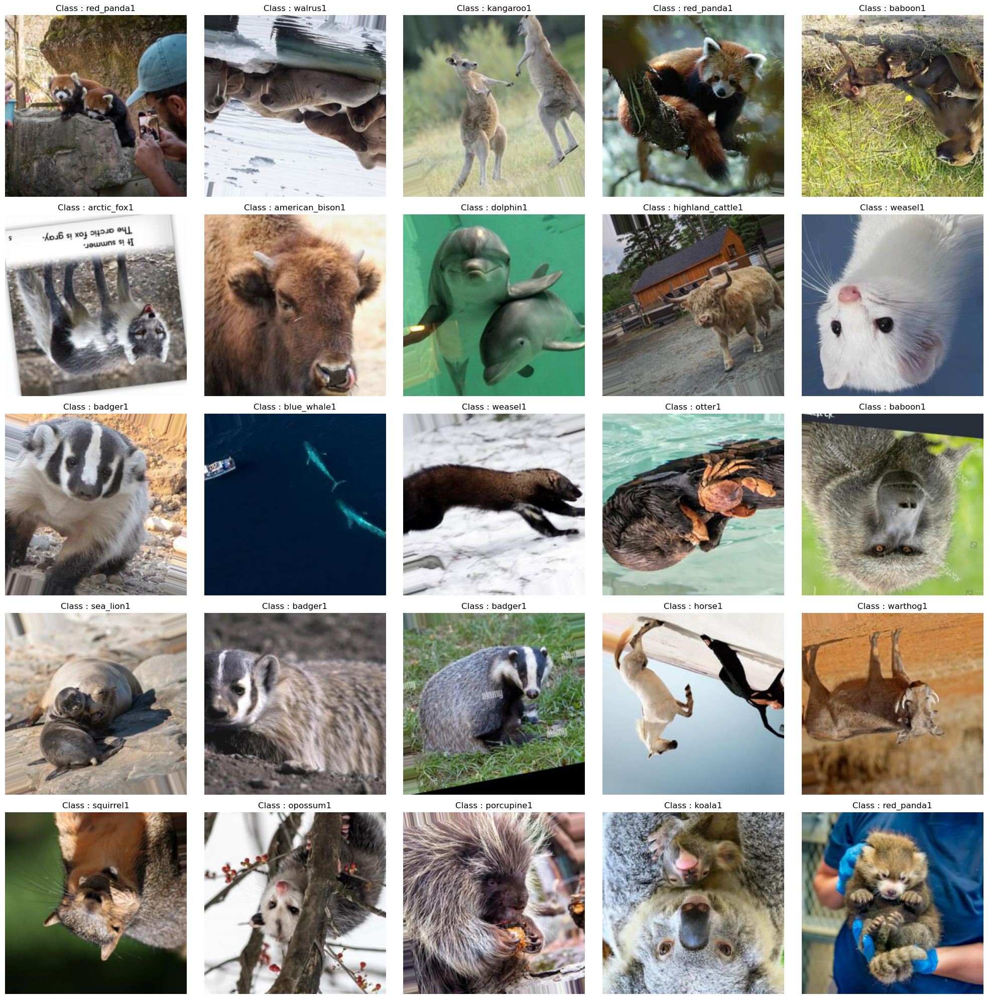

In [17]:
# Set the figure size for the plot
plt.figure(figsize=(20,20))

# Initialize a counter for the subplots
counter=1

# Loop over the train dataset
for images, labels in iter(train_data):
    
    # Get a random image and label
    image, label = get_random_data([images, labels])
    
    # Plot the image with its class name as the title
    plt.subplot(5,5,counter)
    show_image(image, image_title=f"Class : {class_names[int(label)]}")
    
    # Increment the counter
    counter+=1
    
    # End the loop when 25 images have been plotted
    if counter>=26: break

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

In [26]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# Initialize CNN model
cnn_model = Sequential()

# Add convolutional layers
cnn_model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(256, 256, 3)))
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))

cnn_model.add(Conv2D(64, (3, 3), activation='relu'))
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))

cnn_model.add(Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten the layers
cnn_model.add(Flatten())

# Add fully connected layers
cnn_model.add(Dense(512, activation='relu'))
cnn_model.add(Dropout(0.5))

# Output layer
num_classes = 45  # Replace this with the actual number of classes
cnn_model.add(Dense(num_classes, activation='softmax'))

# Compile the model
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
cnn_model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 127, 127, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_9 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 60, 60, 128)       73856     
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 30, 30, 128)      

In [37]:
# Assuming you have test_data and test_labels loaded with your testing dataset

# Evaluate the model on the test dataset
test_loss, test_accuracy = cnn_model.evaluate(test_data, test_labels)

# Print the test accuracy
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")


NameError: name 'test_labels' is not defined

In [32]:
# Assuming you have test_data and test_labels as numpy arrays

# Normalize test_data (assuming it's not normalized yet)
test_data_normalized = test_data / 255.0  # Normalize pixel values

# Evaluate the model on the test data
test_loss, test_accuracy = cnn_model.evaluate(test_data_normalized, test_labels)
print(f"Test accuracy: {test_accuracy * 100:.2f}%")


TypeError: unsupported operand type(s) for /: 'DirectoryIterator' and 'float'

In [ ]:

cnn_model.add(Conv2D(128, (3, 3), activation='relu'))
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten the layers
cnn_model.add(Flatten())

# Add fully connected layers
cnn_model.add(Dense(512, activation='relu'))
cnn_model.add(Dropout(0.5))

# Output layer
cnn_model.add(Dense(num_classes, activation='softmax'))

# Compile the model
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
cnn_history = cnn_model.fit(train_data, steps_per_epoch=steps_per_epoch, validation_data=valid_data, validation_steps=validation_steps, epochs=10)


In [23]:
# Continue adding layers to the CNN model
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))

# Check the loss function used in model compilation
print("Loss function used in the model:", cnn_model.loss)

# Check if categorical_crossentropy is the loss function
if cnn_model.loss == 'categorical_crossentropy':
    print("Loss function is categorical_crossentropy")
else:
    print("Loss function is different")


Loss function used in the model: categorical_crossentropy
Loss function is categorical_crossentropy


In [19]:
from keras.applications import ResNet50V2

# Load pre-trained ResNet50V2 model without classification layers
resnet_base = ResNet50V2(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Freeze the pre-trained layers
for layer in resnet_base.layers:
    layer.trainable = False

# Create a new model on top of ResNet50V2 base
transfer_model = Sequential()
transfer_model.add(resnet_base)
transfer_model.add(Flatten())
transfer_model.add(Dense(256, activation='relu'))
transfer_model.add(Dropout(0.5))
transfer_model.add(Dense(45, activation='softmax'))  # Assuming 45 classes

# Compile the model
transfer_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
transfer_history = transfer_model.fit(train_data, validation_data=valid_data, epochs=10, batch_size=32)


94668760/94668760 [==============================] - 32s 0us/step

Epoch 1/10


ValueError: in user code:

    File "C:\Users\HP\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1401, in train_function  *
        return step_function(self, iterator)
    File "C:\Users\HP\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1384, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\HP\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1373, in run_step  **
        outputs = model.train_step(data)
    File "C:\Users\HP\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1151, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "C:\Users\HP\anaconda3\Lib\site-packages\keras\src\engine\training.py", line 1209, in compute_loss
        return self.compiled_loss(
    File "C:\Users\HP\anaconda3\Lib\site-packages\keras\src\engine\compile_utils.py", line 277, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "C:\Users\HP\anaconda3\Lib\site-packages\keras\src\losses.py", line 143, in __call__
        losses = call_fn(y_true, y_pred)
    File "C:\Users\HP\anaconda3\Lib\site-packages\keras\src\losses.py", line 270, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "C:\Users\HP\anaconda3\Lib\site-packages\keras\src\losses.py", line 2221, in categorical_crossentropy
        return backend.categorical_crossentropy(
    File "C:\Users\HP\anaconda3\Lib\site-packages\keras\src\backend.py", line 5573, in categorical_crossentropy
        target.shape.assert_is_compatible_with(output.shape)

    ValueError: Shapes (None, 1) and (None, 45) are incompatible
